# BERTopic

[2025-03-28 16:39:03.944] [CUML] [info] Building knn graph using brute force


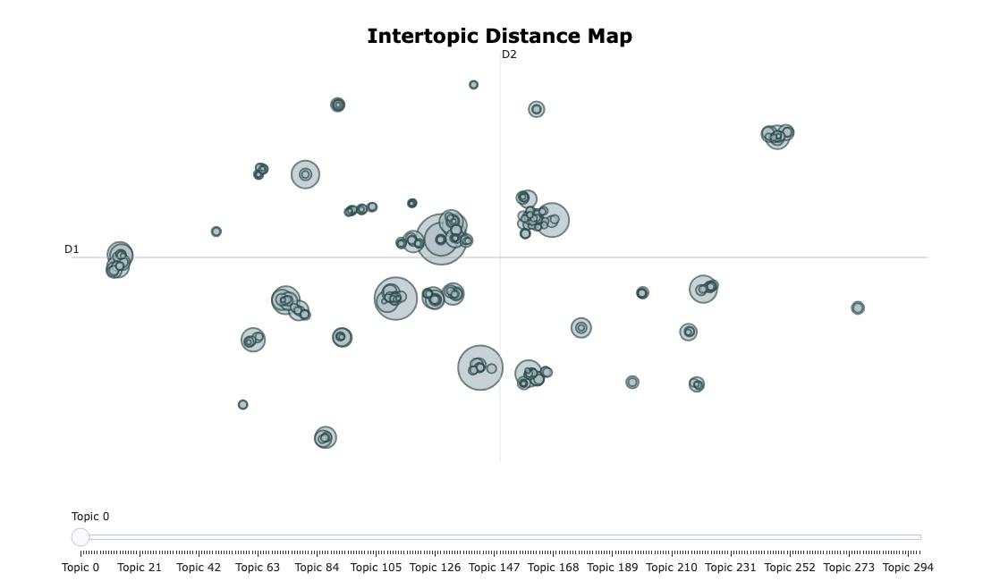

In [53]:
from bertopic import BERTopic
from cuml.cluster import HDBSCAN
from cuml.manifold import UMAP
from datasets import load_dataset

# Load IMDb reviews dataset
dataset = load_dataset("imdb", split="train")
docs = dataset["text"]  # List of text documents

# Create instances of GPU-accelerated UMAP and HDBSCAN
umap_model = UMAP(n_components=5, n_neighbors=15, min_dist=0.0)
hdbscan_model = HDBSCAN(min_samples=10, gen_min_span_tree=True, prediction_data=True)

# Pass the above models to be used in BERTopic
topic_model = BERTopic(
    umap_model=umap_model,
    hdbscan_model=hdbscan_model
)
topics, probs = topic_model.fit_transform(docs)

# Visualize the topics
topic_model.visualize_topics()

Get the Topic ID and the Respective Top Keywords

In [7]:
# Get the topic keywords
topic_info = topic_model.get_topic_info()  # Returns a DataFrame with topic details
topic_info  # Includes Topic ID and top keywords

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15858,-1_the_to_and_of,"[the, to, and, of, it, this, is, in, that, br]","[When I first saw the trailer for Prom Night, ..."
1,0,388,0_show_season_series_episode,"[show, season, series, episode, shows, episode...","[Lost, probably the best t.v series ever made...."
2,1,268,1_bollywood_indian_gandhi_songs,"[bollywood, indian, gandhi, songs, khan, amita...","[My Comments for VIVAH :- Its a charming, idea..."
3,2,240,2_bad_worst_movie_my,"[bad, worst, movie, my, this, you, it, was, ac...",[haha! you have to just smile and smile if you...
4,3,221,3_musical_dance_kelly_sinatra,"[musical, dance, kelly, sinatra, musicals, dan...",[An American In Paris is an integrated musical...
...,...,...,...,...,...
302,301,5,301_keaton_dangerously_johnny_piscopo,"[keaton, dangerously, johnny, piscopo, henner,...",[Jonathan Rivers (Michael Keaton) suddenly bec...
303,302,5,302_mother_addicted_daughter_cheating,"[mother, addicted, daughter, cheating, superse...",['The Mother' is that extraordinary piece of f...
304,303,5,303_meatball_parasites_machine_tetsuo,"[meatball, parasites, machine, tetsuo, splatte...","[Wow baby, this is indeed some fine Asian horr..."
305,304,5,304_powell_joslyn_lane_healey,"[powell, joslyn, lane, healey, mowbray, wildin...",[I first saw this film over 25 years ago on Br...


In [17]:
noise_count = topic_info[topic_info.Topic == -1].Count
float(cp.round((noise_count.values[0]/len(docs)) * 100, 2))

63.43

Get Detailed Keywords for Each Topic

In [2]:
# Get detailed keywords for each topic
for topic_id in set(topics):
    if topic_id != -1:  # Skip noise
        print(f"Topic {topic_id}:")
        print(topic_model.get_topic(topic_id))  # Returns keywords and their scores

Topic 0:
[('movie', np.float64(0.005980423997691189)), ('bad', np.float64(0.005325115922480674)), ('it', np.float64(0.004848133966952768)), ('this', np.float64(0.004806214905040321)), ('you', np.float64(0.004496037884492041)), ('was', np.float64(0.004461701251853652)), ('my', np.float64(0.003998376823186004)), ('funny', np.float64(0.0038980238357997333)), ('worst', np.float64(0.003666864917935352)), ('just', np.float64(0.003648936408524813))]
Topic 1:
[('japanese', np.float64(0.00576757743047926)), ('chinese', np.float64(0.004079247105332474)), ('of', np.float64(0.00356498565404382)), ('the', np.float64(0.0035634678875628317)), ('and', np.float64(0.003451655702954104)), ('is', np.float64(0.003448130258802946)), ('martial', np.float64(0.0034254392785354835)), ('in', np.float64(0.0033497766951509815)), ('animation', np.float64(0.00327898375861482)), ('film', np.float64(0.003243962609426988))]
Topic 2:
[('show', np.float64(0.01900626462923281)), ('season', np.float64(0.007457318853924025)

Map Documents to Their Topics

In [3]:
# Map documents to their topics
doc_topics = [
    {
        "document": doc,
        "topic": topic_id,
        "keywords": topic_model.get_topic(topic_id) if topic_id != -1 else "Noise"
    }
    for doc, topic_id in zip(docs, topics)
]

# Convert to a readable format
for doc_topic in doc_topics[:10]:
    print(f"Document: {doc_topic['document']}")
    print(f"Assigned Topic: {doc_topic['topic']}")
    print(f"Keywords: {doc_topic['keywords']}")
    print()

Document: I rented I AM CURIOUS-YELLOW from my video store because of all the controversy that surrounded it when it was first released in 1967. I also heard that at first it was seized by U.S. customs if it ever tried to enter this country, therefore being a fan of films considered "controversial" I really had to see this for myself.<br /><br />The plot is centered around a young Swedish drama student named Lena who wants to learn everything she can about life. In particular she wants to focus her attentions to making some sort of documentary on what the average Swede thought about certain political issues such as the Vietnam War and race issues in the United States. In between asking politicians and ordinary denizens of Stockholm about their opinions on politics, she has sex with her drama teacher, classmates, and married men.<br /><br />What kills me about I AM CURIOUS-YELLOW is that 40 years ago, this was considered pornographic. Really, the sex and nudity scenes are few and far be

# HPO

The above example has 63% of the docs clustered as noise, to minimize the noise cluster to a specific percentage (i.e.~20%) while optimizing the BERTopic performance, you can do HPO and try to maximize the metric:

$$
\textbf{Metric} = 0.4 \times \text{Coherence} + 0.3 \times \text{Diversity} - 0.3 \times \left| \frac{(\text{Noise  or } -1 \text{ Cluster})\% - 20}{100} \right|
$$

In [2]:
import optuna
import cupy as cp
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

In [ ]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"  # Disable parallelism

In [86]:
%%time

def train_and_eval(n_components=5, n_neighbors=15, min_dist=0.0, min_samples=10, gen_min_span_tree=True, prediction_data=True):
    try:
        # Create instances of GPU-accelerated UMAP and HDBSCAN
        spread_val = max(min_dist + 1e-3, 1.0)
        umap_model = UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, spread=spread_val)
        hdbscan_model = HDBSCAN(min_samples=min_samples, gen_min_span_tree=gen_min_span_tree, prediction_data=prediction_data)

        # Pass the models to BERTopic
        topic_model = BERTopic(umap_model=umap_model, hdbscan_model=hdbscan_model)
        topics, probs = topic_model.fit_transform(docs)

        # Get topic info
        topic_info = topic_model.get_topic_info()
        noise_row = topic_info[topic_info.Topic == -1]

        # Calculate the noise percentage
        noise_count = noise_row.Count.values[0] if not noise_row.empty else 0
        perc = float(cp.round((noise_count / len(docs)) * 100, 2))
        noise_penalty = abs(perc - 20)

        # Extract topic words (exclude outliers -1)
        topic_words = [
            [word for word, _ in topic_model.get_topic(topic) if word] 
            for topic in set(topics) if topic != -1
        ]
        
        # Tokenize documents (adjust preprocessing as needed)
        tokenized_docs = [doc.split() for doc in docs]  
        dictionary = Dictionary(tokenized_docs)
        
        # Calculate coherence (c_v or c_npmi)
        coherence_model = CoherenceModel(
            topics=topic_words,
            texts=tokenized_docs,
            dictionary=dictionary,
            coherence='c_v'
        )

        # Flatten topic words and compute unique ratio
        all_words = [word for topic in topic_words for word in topic]
        diversity = len(set(all_words)) / len(all_words) if all_words else 0

        # Combined score (maximize this)
        # Weights can be adjusted based on priorities
        score = (0.4 * coherence_model.get_coherence()) + (0.3 * diversity) - (0.3 * noise_penalty/100)
        
        return score

    except Exception as e:
        print(f"[Trial failed] Exception: {e}")
        return -100.0  # worst-case penalty to allow Optuna to continue


def objective(trial):
    params = {
        "n_components": trial.suggest_int("n_components", 5, 20),
        "n_neighbors": trial.suggest_int("n_neighbors", 5, 20),
        "min_dist": trial.suggest_float("min_dist", 0.0, 1.0),
        "min_samples": trial.suggest_int("min_samples", 5, 25),
        "gen_min_span_tree": trial.suggest_categorical("gen_min_span_tree", [True, False]),
        "prediction_data": trial.suggest_categorical("prediction_data", [True, False]),  
    }
    return train_and_eval(**params)


study = optuna.create_study(
    direction="maximize",
    study_name="optuna_bertopic",
    sampler=optuna.samplers.TPESampler(seed=142),
)

study.optimize(objective, n_trials=40)

print(f"Best params: {study.best_params}")

[I 2025-03-28 17:57:28,884] A new study created in memory with name: optuna_bertopic


[2025-03-28 17:57:52.123] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:58:03,678] Trial 0 finished with value: 0.1485190083272498 and parameters: {'n_components': 19, 'n_neighbors': 13, 'min_dist': 0.6559847055064072, 'min_samples': 22, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 0 with value: 0.1485190083272498.


[2025-03-28 17:58:25.355] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:58:43,721] Trial 1 finished with value: 0.2333663561948312 and parameters: {'n_components': 11, 'n_neighbors': 17, 'min_dist': 0.7855316209877806, 'min_samples': 8, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 1 with value: 0.2333663561948312.


[2025-03-28 17:59:05.276] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:59:16,615] Trial 2 finished with value: 0.14049795457925618 and parameters: {'n_components': 14, 'n_neighbors': 11, 'min_dist': 0.9578462739625135, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 1 with value: 0.2333663561948312.


[2025-03-28 17:59:38.615] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:59:49,763] Trial 3 finished with value: 0.20331421743852263 and parameters: {'n_components': 16, 'n_neighbors': 13, 'min_dist': 0.8552674895776905, 'min_samples': 25, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 1 with value: 0.2333663561948312.


[2025-03-28 18:00:11.588] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:00:27,846] Trial 4 finished with value: 0.23228293806189623 and parameters: {'n_components': 16, 'n_neighbors': 14, 'min_dist': 0.17615075495259813, 'min_samples': 20, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 1 with value: 0.2333663561948312.


[2025-03-28 18:00:49.463] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:01:05,046] Trial 5 finished with value: 0.20694654181522978 and parameters: {'n_components': 6, 'n_neighbors': 19, 'min_dist': 0.919979952129186, 'min_samples': 13, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 1 with value: 0.2333663561948312.


[2025-03-28 18:01:27.140] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:01:44,931] Trial 6 finished with value: 0.24435365558769115 and parameters: {'n_components': 18, 'n_neighbors': 11, 'min_dist': 0.5024363814847549, 'min_samples': 14, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 6 with value: 0.24435365558769115.


[2025-03-28 18:02:06.822] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:02:24,372] Trial 7 finished with value: 0.21372853117319238 and parameters: {'n_components': 11, 'n_neighbors': 8, 'min_dist': 0.537753088603063, 'min_samples': 23, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 6 with value: 0.24435365558769115.


[2025-03-28 18:02:46.285] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:03:03,692] Trial 8 finished with value: 0.23830650823966767 and parameters: {'n_components': 10, 'n_neighbors': 12, 'min_dist': 0.41410321525062666, 'min_samples': 16, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 6 with value: 0.24435365558769115.


[2025-03-28 18:03:25.893] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:03:42,948] Trial 9 finished with value: 0.2521541160704352 and parameters: {'n_components': 8, 'n_neighbors': 13, 'min_dist': 0.35778167444036124, 'min_samples': 13, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 9 with value: 0.2521541160704352.


[2025-03-28 18:04:04.984] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:04:11,024] Trial 10 finished with value: -100.0 and parameters: {'n_components': 5, 'n_neighbors': 6, 'min_dist': 0.0856621756325428, 'min_samples': 5, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 9 with value: 0.2521541160704352.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:04:32.505] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:04:52,477] Trial 11 finished with value: 0.25692330736379515 and parameters: {'n_components': 8, 'n_neighbors': 10, 'min_dist': 0.3374219543532606, 'min_samples': 13, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 11 with value: 0.25692330736379515.


[2025-03-28 18:05:14.549] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:05:20,095] Trial 12 finished with value: -100.0 and parameters: {'n_components': 8, 'n_neighbors': 8, 'min_dist': 0.3388178530738021, 'min_samples': 10, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 11 with value: 0.25692330736379515.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:05:41.328] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:05:58,056] Trial 13 finished with value: 0.24550376754561584 and parameters: {'n_components': 8, 'n_neighbors': 16, 'min_dist': 0.25673967361687844, 'min_samples': 17, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 11 with value: 0.25692330736379515.


[2025-03-28 18:06:19.499] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:06:37,813] Trial 14 finished with value: 0.30003534147842154 and parameters: {'n_components': 8, 'n_neighbors': 9, 'min_dist': 0.0045627272301160815, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:06:59.458] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:07:17,583] Trial 15 finished with value: 0.28870094450748074 and parameters: {'n_components': 13, 'n_neighbors': 9, 'min_dist': 0.01220889339722819, 'min_samples': 10, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:07:39.169] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:07:45,104] Trial 16 finished with value: -100.0 and parameters: {'n_components': 13, 'n_neighbors': 5, 'min_dist': 0.0006437570234126104, 'min_samples': 9, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:08:06.281] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:08:12,182] Trial 17 finished with value: -100.0 and parameters: {'n_components': 15, 'n_neighbors': 8, 'min_dist': 0.015815965764340075, 'min_samples': 5, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:08:33.394] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:08:51,853] Trial 18 finished with value: 0.26959125827641967 and parameters: {'n_components': 12, 'n_neighbors': 9, 'min_dist': 0.16067572941457242, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:09:13.235] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:09:19,489] Trial 19 finished with value: -100.0 and parameters: {'n_components': 10, 'n_neighbors': 6, 'min_dist': 0.15274570456462466, 'min_samples': 7, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:09:40.901] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:09:56,941] Trial 20 finished with value: 0.2480586369126057 and parameters: {'n_components': 6, 'n_neighbors': 15, 'min_dist': 0.22516299340738266, 'min_samples': 18, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:10:18.729] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:10:39,244] Trial 21 finished with value: 0.2742768831747563 and parameters: {'n_components': 12, 'n_neighbors': 9, 'min_dist': 0.09339222548215165, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:11:00.892] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:11:19,616] Trial 22 finished with value: 0.27821410750802933 and parameters: {'n_components': 13, 'n_neighbors': 10, 'min_dist': 0.08393765595821234, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:11:40.894] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:11:59,749] Trial 23 finished with value: 0.2777418622583672 and parameters: {'n_components': 13, 'n_neighbors': 10, 'min_dist': 0.06629257510105882, 'min_samples': 12, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:12:20.959] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:12:26,910] Trial 24 finished with value: -100.0 and parameters: {'n_components': 15, 'n_neighbors': 7, 'min_dist': 0.2554846241302895, 'min_samples': 7, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:12:48.258] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:13:04,862] Trial 25 finished with value: 0.2739433841033961 and parameters: {'n_components': 17, 'n_neighbors': 11, 'min_dist': 0.0023101775808360603, 'min_samples': 15, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:13:27.414] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:13:49,160] Trial 26 finished with value: 0.2763081509414652 and parameters: {'n_components': 10, 'n_neighbors': 9, 'min_dist': 0.1278547749871354, 'min_samples': 9, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:14:10.613] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:14:16,304] Trial 27 finished with value: -100.0 and parameters: {'n_components': 14, 'n_neighbors': 7, 'min_dist': 0.06423500511965496, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:14:38.019] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:15:00,076] Trial 28 finished with value: 0.266076841372462 and parameters: {'n_components': 14, 'n_neighbors': 10, 'min_dist': 0.22035062204579414, 'min_samples': 7, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:15:21.432] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:15:39,387] Trial 29 finished with value: 0.2448035174339377 and parameters: {'n_components': 20, 'n_neighbors': 12, 'min_dist': 0.4194275042790474, 'min_samples': 9, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:16:01.158] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:16:06,418] Trial 30 finished with value: -100.0 and parameters: {'n_components': 9, 'n_neighbors': 5, 'min_dist': 0.7216519748157755, 'min_samples': 15, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:16:27.602] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:16:45,755] Trial 31 finished with value: 0.27182629922113344 and parameters: {'n_components': 13, 'n_neighbors': 10, 'min_dist': 0.08721209509217612, 'min_samples': 12, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:17:07.111] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:17:25,648] Trial 32 finished with value: 0.2720184016760168 and parameters: {'n_components': 12, 'n_neighbors': 10, 'min_dist': 0.0369328032583982, 'min_samples': 12, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:17:47.363] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:18:06,362] Trial 33 finished with value: 0.26983252597798235 and parameters: {'n_components': 11, 'n_neighbors': 11, 'min_dist': 0.1098434410642361, 'min_samples': 10, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:18:27.641] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:18:33,492] Trial 34 finished with value: -100.0 and parameters: {'n_components': 14, 'n_neighbors': 7, 'min_dist': 0.5654247210184258, 'min_samples': 8, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
[2025-03-28 18:18:55.339] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:19:12,998] Trial 35 finished with value: 0.25165107113088536 and parameters: {'n_components': 13, 'n_neighbors': 14, 'min_dist': 0.18892158911493587, 'min_samples': 14, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:19:34.415] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:19:52,054] Trial 36 finished with value: 0.27240769345527854 and parameters: {'n_components': 16, 'n_neighbors': 9, 'min_dist': 0.05451549372092847, 'min_samples': 12, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:20:13.212] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:20:31,445] Trial 37 finished with value: 0.24055630287002605 and parameters: {'n_components': 15, 'n_neighbors': 19, 'min_dist': 0.29225146611683855, 'min_samples': 10, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:20:52.983] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:21:09,343] Trial 38 finished with value: 0.2505494189618853 and parameters: {'n_components': 11, 'n_neighbors': 12, 'min_dist': 0.14856802808203873, 'min_samples': 19, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[2025-03-28 18:21:31.446] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 18:21:36,957] Trial 39 finished with value: -100.0 and parameters: {'n_components': 18, 'n_neighbors': 8, 'min_dist': 0.8433903744638245, 'min_samples': 14, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 14 with value: 0.30003534147842154.


[Trial failed] Exception: unable to interpret topic as either a list of tokens or a list of ids
Best params: {'n_components': 8, 'n_neighbors': 9, 'min_dist': 0.0045627272301160815, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': False}
CPU times: user 20min 10s, sys: 1min 43s, total: 21min 53s
Wall time: 24min 8s


Apply HPO best results to BERTopic

[2025-03-28 18:23:28.191] [CUML] [info] Building knn graph using brute force


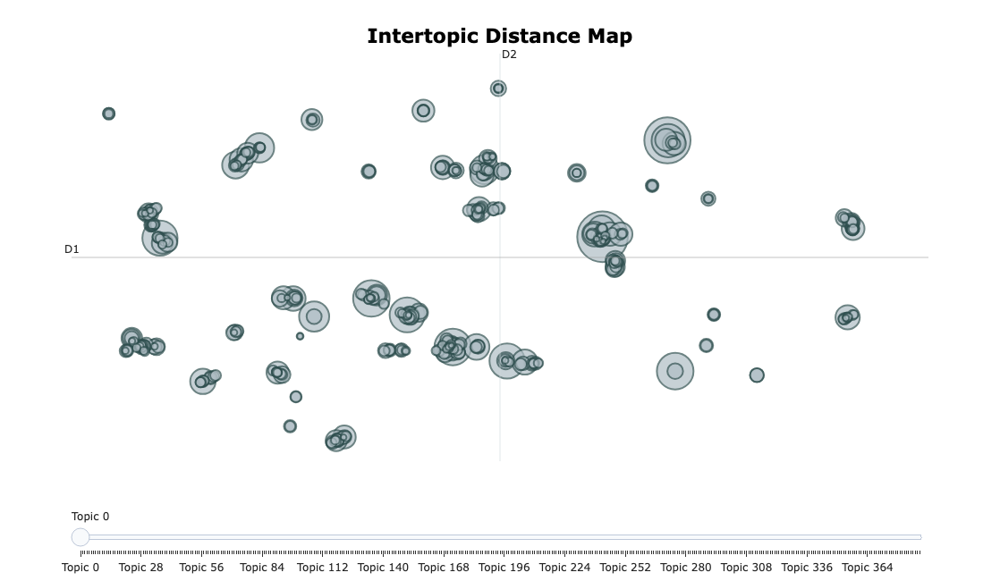

In [87]:
# Create instances of GPU-accelerated UMAP and HDBSCAN
spread_val = max(study.best_params['min_dist'] + 1e-3, 1.0)
umap_model = UMAP(n_components=study.best_params['n_components'], n_neighbors=study.best_params['n_neighbors'], min_dist=study.best_params['min_dist'], spread=spread_val)
hdbscan_model = HDBSCAN(min_samples=study.best_params['min_samples'], gen_min_span_tree=study.best_params['gen_min_span_tree'], prediction_data=study.best_params['prediction_data'])

# Pass the models to BERTopic
topic_model = BERTopic(umap_model=umap_model, hdbscan_model=hdbscan_model)
topics, probs = topic_model.fit_transform(docs)

# Visualize the topics
topic_model.visualize_topics()

Check the cluster sizes

In [88]:
# Get the topic keywords
topic_info = topic_model.get_topic_info()  # Returns a DataFrame with topic details
topic_info  # Includes Topic ID and top keywords

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11280,-1_the_to_it_this,"[the, to, it, this, and, of, that, is, was, in]","[What's wrong with this film? Many, many thing..."
1,0,439,0_horror_scary_ghost_movie,"[horror, scary, ghost, movie, scarecrow, movie...","[When I first popped in Happy Birthday to Me, ..."
2,1,366,1_bollywood_indian_kapoor_akshay,"[bollywood, indian, kapoor, akshay, india, ami...",[Time For A Hit!<br /><br />Waqt Dir- Vipul Am...
3,2,230,2_bad_funny_movie_this,"[bad, funny, movie, this, comedy, film, worst,...",[This has to be THE WORST film I have ever see...
4,3,230,3_christian_jesus_god_church,"[christian, jesus, god, church, religious, rel...",[I sat through this movie expecting a thought-...
...,...,...,...,...,...
385,384,6,384_burt_cannonball_loni_stroker,"[burt, cannonball, loni, stroker, reynolds, na...",[Burt Reynolds came to a point in his career w...
386,385,6,385_gregorys_gregory_teacher_frances,"[gregorys, gregory, teacher, frances, bel, cha...",[Watched this film having really enjoyed Grego...
387,386,5,386_blonder_denise_blonde_pamela,"[blonder, denise, blonde, pamela, anderson, ri...","[Blonde and Blonder was unfunny.Basically, it ..."
388,387,5,387_skull_screaming_gardener_whitlock,"[skull, screaming, gardener, whitlock, peacock...","[I am not a big fan of horror films, and have ..."


Calculate Coherence Score (c_v)

In [101]:
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary
import re

# Preprocess and tokenize documents
def preprocess(doc):
    doc = re.sub(r'<.*?>', '', doc)  # remove HTML
    doc = re.sub(r'[^a-zA-Z\s]', '', doc)  # remove non-alphabetic chars
    doc = doc.lower()
    return doc.split()

tokenized_docs = [preprocess(doc) for doc in docs]
dictionary = Dictionary(tokenized_docs)

# Extract topic words
topic_words = [
    [word for word, _ in topic_model.get_topic(topic) if word in dictionary.token2id] 
    for topic in set(topics) if topic != -1
]

# Coherence calculation
coherence_model = CoherenceModel(
    topics=topic_words,
    texts=tokenized_docs,
    dictionary=dictionary,
    coherence='c_v'
)
print(f"Coherence Score: {coherence_model.get_coherence():.4f}")


Coherence Score: 0.7012


Calculate Diversity Score 

In [102]:
# Flatten topic words and compute unique ratio
all_words = [word for topic in topic_words for word in topic]
diversity = len(set(all_words)) / len(all_words) if all_words else 0
print(f"Diversity Score: {diversity:.4f}")


Diversity Score: 0.7855


Calculate Noise (-1 Cluster) Percentage

In [103]:
# Get topic info
topic_info = topic_model.get_topic_info()
noise_row = topic_info[topic_info.Topic == -1]

# Calculate the noise percentage
noise_count = noise_row.Count.values[0] if not noise_row.empty else 0
perc = float(cp.round((noise_count / len(docs)) * 100, 2))
perc

45.12

A good c_v Coherence Score typically ranges:

* above 0.5 = Acceptable

* above 0.65 = Good

* above 0.75 = Excellent

And a good Diversity Score is usually ≥ 0.85

It looks like we have got a relatively good Coherence Score and Diversity Score, even if the Noise (-1 Cluster) percentage is still higher than the criteria (~20%).

# HPO Alternative

If the above results indicate relatively low Diversity Score and Coherence Score, it means that your clustering results need further improvements. In addition, if the Noise (-1 Cluster) does not meet the criteria of ~20%, you can use alternative metric to optimize HPO. For example, minimizing the metric:

$$
\textbf{Metric} = \left| (\text{Noise or } -1 \text{ Cluster}) \% - 20 \right|
$$


In [80]:
%%time

def train_and_eval(n_components=5, n_neighbors=15, min_dist=0.0, min_samples=10, gen_min_span_tree=True, prediction_data=True):
    try:
        # Create instances of GPU-accelerated UMAP and HDBSCAN
        spread_val = max(min_dist + 1e-3, 1.0)
        umap_model = UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, spread=spread_val)
        hdbscan_model = HDBSCAN(min_samples=min_samples, gen_min_span_tree=gen_min_span_tree, prediction_data=prediction_data)

        # Pass the models to BERTopic
        topic_model = BERTopic(umap_model=umap_model, hdbscan_model=hdbscan_model)
        topics, probs = topic_model.fit_transform(docs)

        # Get topic info
        topic_info = topic_model.get_topic_info()
        noise_row = topic_info[topic_info.Topic == -1]

        # Calculate the noise percentage
        noise_count = noise_row.Count.values[0] if not noise_row.empty else 0
        perc = float(cp.round((noise_count / len(docs)) * 100, 2))
        noise_penalty = abs(perc - 20)
        
        return noise_penalty

    except Exception as e:
        print(f"[Trial failed] Exception: {e}")
        return -100.0  # worst-case penalty to allow Optuna to continue


def objective(trial):
    params = {
        "n_components": trial.suggest_int("n_components", 5, 20),
        "n_neighbors": trial.suggest_int("n_neighbors", 5, 20),
        "min_dist": trial.suggest_float("min_dist", 0.0, 1.0),
        "min_samples": trial.suggest_int("min_samples", 5, 25),
        "gen_min_span_tree": trial.suggest_categorical("gen_min_span_tree", [True, False]),
        "prediction_data": trial.suggest_categorical("prediction_data", [True, False]),  
    }
    return train_and_eval(**params)


study = optuna.create_study(
    direction="minimize",
    study_name="optuna_bertopic",
    sampler=optuna.samplers.TPESampler(seed=142),
)

study.optimize(objective, n_trials=40)

print(f"Best params: {study.best_params}")
print(f"Best noise percentage: {study.best_value + 20}")

[I 2025-03-28 17:33:15,611] A new study created in memory with name: optuna_bertopic


[2025-03-28 17:33:37.271] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:33:39,831] Trial 0 finished with value: 18.89 and parameters: {'n_components': 19, 'n_neighbors': 13, 'min_dist': 0.6559847055064072, 'min_samples': 22, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:34:02.132] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:34:05,456] Trial 1 finished with value: 45.81999999999999 and parameters: {'n_components': 11, 'n_neighbors': 17, 'min_dist': 0.7855316209877806, 'min_samples': 8, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 0 with value: 18.89.


[2025-03-28 17:34:26.983] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:34:29,451] Trial 2 finished with value: 19.26 and parameters: {'n_components': 14, 'n_neighbors': 11, 'min_dist': 0.9578462739625135, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:34:50.619] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:34:53,188] Trial 3 finished with value: 19.66 and parameters: {'n_components': 16, 'n_neighbors': 13, 'min_dist': 0.8552674895776905, 'min_samples': 25, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:35:14.563] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:35:17,744] Trial 4 finished with value: 43.38 and parameters: {'n_components': 16, 'n_neighbors': 14, 'min_dist': 0.17615075495259813, 'min_samples': 20, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:35:39.484] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:35:41,761] Trial 5 finished with value: 19.86 and parameters: {'n_components': 6, 'n_neighbors': 19, 'min_dist': 0.919979952129186, 'min_samples': 13, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 0 with value: 18.89.


[2025-03-28 17:36:03.140] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:36:06,574] Trial 6 finished with value: 42.03 and parameters: {'n_components': 18, 'n_neighbors': 11, 'min_dist': 0.5024363814847549, 'min_samples': 14, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 0 with value: 18.89.


[2025-03-28 17:36:27.858] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:36:30,988] Trial 7 finished with value: 46.2 and parameters: {'n_components': 11, 'n_neighbors': 8, 'min_dist': 0.537753088603063, 'min_samples': 23, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 0 with value: 18.89.


[2025-03-28 17:36:52.128] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:36:55,326] Trial 8 finished with value: 42.3 and parameters: {'n_components': 10, 'n_neighbors': 12, 'min_dist': 0.41410321525062666, 'min_samples': 16, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:37:17.385] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:37:20,626] Trial 9 finished with value: 36.12 and parameters: {'n_components': 8, 'n_neighbors': 13, 'min_dist': 0.35778167444036124, 'min_samples': 13, 'gen_min_span_tree': True, 'prediction_data': False}. Best is trial 0 with value: 18.89.


[2025-03-28 17:37:41.769] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:37:45,211] Trial 10 finished with value: 46.58 and parameters: {'n_components': 20, 'n_neighbors': 6, 'min_dist': 0.6685212884848171, 'min_samples': 18, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 0 with value: 18.89.


[2025-03-28 17:38:06.674] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:38:09,301] Trial 11 finished with value: 14.59 and parameters: {'n_components': 14, 'n_neighbors': 10, 'min_dist': 0.9752666435305117, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 11 with value: 14.59.


[2025-03-28 17:38:30.743] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:38:33,501] Trial 12 finished with value: 17.38 and parameters: {'n_components': 20, 'n_neighbors': 8, 'min_dist': 0.6952039371855945, 'min_samples': 25, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 11 with value: 14.59.


[2025-03-28 17:38:54.749] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:38:57,638] Trial 13 finished with value: 51.760000000000005 and parameters: {'n_components': 14, 'n_neighbors': 8, 'min_dist': 0.7379187672472133, 'min_samples': 25, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 11 with value: 14.59.


[2025-03-28 17:39:18.780] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:39:21,715] Trial 14 finished with value: 16.29 and parameters: {'n_components': 17, 'n_neighbors': 5, 'min_dist': 0.9804493719269255, 'min_samples': 19, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 11 with value: 14.59.


[2025-03-28 17:39:43.912] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:39:46,636] Trial 15 finished with value: 14.170000000000002 and parameters: {'n_components': 16, 'n_neighbors': 5, 'min_dist': 0.9910047999240952, 'min_samples': 18, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:40:08.051] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:40:11,513] Trial 16 finished with value: 25.380000000000003 and parameters: {'n_components': 14, 'n_neighbors': 9, 'min_dist': 0.009710953243211029, 'min_samples': 10, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:40:32.925] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:40:37,016] Trial 17 finished with value: 26.43 and parameters: {'n_components': 13, 'n_neighbors': 6, 'min_dist': 0.8579976912797173, 'min_samples': 5, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:40:58.229] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:41:00,647] Trial 18 finished with value: 19.54 and parameters: {'n_components': 15, 'n_neighbors': 17, 'min_dist': 0.8011913883426007, 'min_samples': 17, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:41:21.973] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:41:24,896] Trial 19 finished with value: 57.019999999999996 and parameters: {'n_components': 9, 'n_neighbors': 5, 'min_dist': 0.9991395282732443, 'min_samples': 20, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:41:46.035] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:41:49,195] Trial 20 finished with value: 39.01 and parameters: {'n_components': 12, 'n_neighbors': 15, 'min_dist': 0.25637609966733604, 'min_samples': 15, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 15 with value: 14.170000000000002.


[2025-03-28 17:42:10.318] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:42:13,030] Trial 21 finished with value: 14.090000000000003 and parameters: {'n_components': 17, 'n_neighbors': 5, 'min_dist': 0.9947098174680891, 'min_samples': 19, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 21 with value: 14.090000000000003.


[2025-03-28 17:42:34.443] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:42:37,044] Trial 22 finished with value: 17.92 and parameters: {'n_components': 16, 'n_neighbors': 10, 'min_dist': 0.8699964374570444, 'min_samples': 21, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 21 with value: 14.090000000000003.


[2025-03-28 17:42:58.422] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:43:01,759] Trial 23 finished with value: 42.15 and parameters: {'n_components': 17, 'n_neighbors': 7, 'min_dist': 0.5847910272227794, 'min_samples': 18, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 21 with value: 14.090000000000003.


[2025-03-28 17:43:23.395] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:43:26,731] Trial 24 finished with value: 55.769999999999996 and parameters: {'n_components': 18, 'n_neighbors': 5, 'min_dist': 0.8822860996711417, 'min_samples': 16, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 21 with value: 14.090000000000003.


[2025-03-28 17:43:47.824] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:43:50,347] Trial 25 finished with value: 10.42 and parameters: {'n_components': 13, 'n_neighbors': 7, 'min_dist': 0.7962363369429344, 'min_samples': 19, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 25 with value: 10.42.


[2025-03-28 17:44:11.368] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:44:14,461] Trial 26 finished with value: 47.3 and parameters: {'n_components': 12, 'n_neighbors': 7, 'min_dist': 0.803308684063803, 'min_samples': 19, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 25 with value: 10.42.


[2025-03-28 17:44:36.699] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:44:40,317] Trial 27 finished with value: 39.24 and parameters: {'n_components': 15, 'n_neighbors': 6, 'min_dist': 0.6034141934538964, 'min_samples': 11, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 25 with value: 10.42.


[2025-03-28 17:45:01.585] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:45:04,349] Trial 28 finished with value: 10.19 and parameters: {'n_components': 17, 'n_neighbors': 7, 'min_dist': 0.9259315888773263, 'min_samples': 17, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 28 with value: 10.19.


[2025-03-28 17:45:25.992] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:45:28,834] Trial 29 finished with value: 6.039999999999999 and parameters: {'n_components': 19, 'n_neighbors': 7, 'min_dist': 0.7324872244094608, 'min_samples': 23, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:45:49.983] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:45:52,771] Trial 30 finished with value: 16.73 and parameters: {'n_components': 18, 'n_neighbors': 9, 'min_dist': 0.7399014409319615, 'min_samples': 23, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:46:13.839] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:46:16,646] Trial 31 finished with value: 6.859999999999999 and parameters: {'n_components': 19, 'n_neighbors': 7, 'min_dist': 0.9128500396350542, 'min_samples': 21, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:46:38.244] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:46:40,968] Trial 32 finished with value: 6.17 and parameters: {'n_components': 19, 'n_neighbors': 7, 'min_dist': 0.7513873033759931, 'min_samples': 21, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:47:02.579] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:47:05,407] Trial 33 finished with value: 14.5 and parameters: {'n_components': 19, 'n_neighbors': 9, 'min_dist': 0.7270599570639222, 'min_samples': 23, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:47:26.589] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:47:29,307] Trial 34 finished with value: 6.92 and parameters: {'n_components': 19, 'n_neighbors': 7, 'min_dist': 0.8975720980727714, 'min_samples': 21, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:47:50.491] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:47:53,790] Trial 35 finished with value: 47.56999999999999 and parameters: {'n_components': 19, 'n_neighbors': 10, 'min_dist': 0.625497048312118, 'min_samples': 21, 'gen_min_span_tree': False, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:48:14.858] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:48:17,555] Trial 36 finished with value: 19.73 and parameters: {'n_components': 20, 'n_neighbors': 11, 'min_dist': 0.9092283811968414, 'min_samples': 24, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:48:38.684] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:48:41,555] Trial 37 finished with value: 12.280000000000001 and parameters: {'n_components': 19, 'n_neighbors': 8, 'min_dist': 0.8180422000995436, 'min_samples': 21, 'gen_min_span_tree': True, 'prediction_data': True}. Best is trial 29 with value: 6.039999999999999.


[2025-03-28 17:49:03.346] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:49:06,192] Trial 38 finished with value: 1.379999999999999 and parameters: {'n_components': 18, 'n_neighbors': 6, 'min_dist': 0.7578714385526387, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 38 with value: 1.379999999999999.


[2025-03-28 17:49:27.659] [CUML] [info] Building knn graph using brute force


[I 2025-03-28 17:49:30,977] Trial 39 finished with value: 50.22 and parameters: {'n_components': 18, 'n_neighbors': 6, 'min_dist': 0.5626271176174291, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': False}. Best is trial 38 with value: 1.379999999999999.


Best params: {'n_components': 18, 'n_neighbors': 6, 'min_dist': 0.7578714385526387, 'min_samples': 22, 'gen_min_span_tree': False, 'prediction_data': False}
Best noise percentage: 21.38
CPU times: user 15min 36s, sys: 1.34 s, total: 15min 38s
Wall time: 16min 15s


Apply HPO best results to BERTopic

[2025-03-28 17:55:13.962] [CUML] [info] Building knn graph using brute force


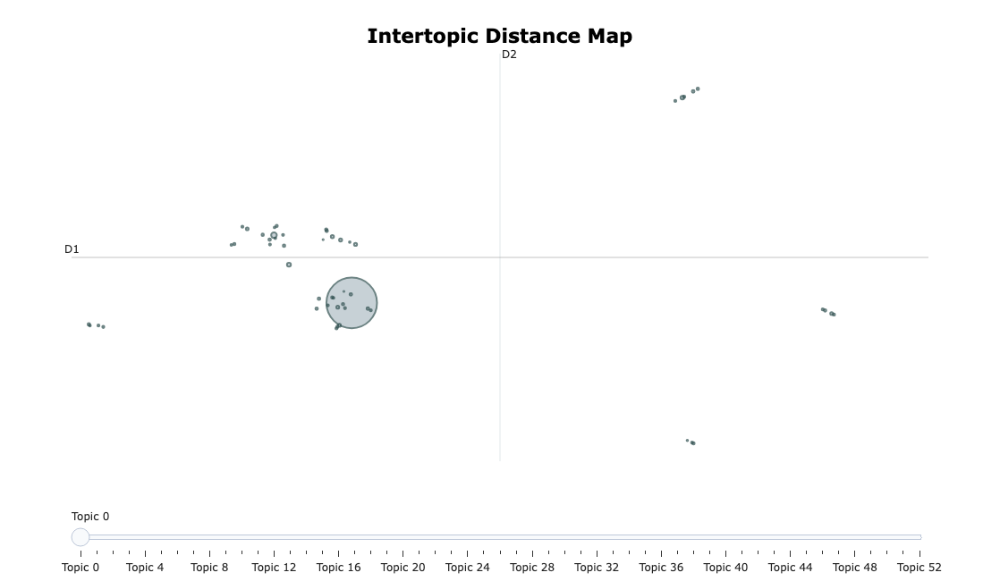

In [81]:
# Create instances of GPU-accelerated UMAP and HDBSCAN
spread_val = max(study.best_params['min_dist'] + 1e-3, 1.0)
umap_model = UMAP(n_components=study.best_params['n_components'], n_neighbors=study.best_params['n_neighbors'], min_dist=study.best_params['min_dist'], spread=spread_val)
hdbscan_model = HDBSCAN(min_samples=study.best_params['min_samples'], gen_min_span_tree=study.best_params['gen_min_span_tree'], prediction_data=study.best_params['prediction_data'])

# Pass the models to BERTopic
topic_model = BERTopic(umap_model=umap_model, hdbscan_model=hdbscan_model)
topics, probs = topic_model.fit_transform(docs)

# Visualize the topics
topic_model.visualize_topics()

Check the cluster sizes

In [82]:
# Get the topic keywords
topic_info = topic_model.get_topic_info()  # Returns a DataFrame with topic details
topic_info  # Includes Topic ID and top keywords

,Topic,Count,Name,Representation,Representative_Docs
0,-1,5445,-1_the_to_and_of,"[the, to, and, of, this, it, is, that, movie, in]","[How viewers react to this new ""adaption"" of S..."
1,0,17432,0_the_and_of_to,"[the, and, of, to, is, in, that, it, this, br]",[I have yet to see a film with Nolte in it tha...
2,1,217,1_movie_this_it_was,"[movie, this, it, was, the, to, that, and, you...",[My friends and I went into this movie not kno...
3,2,105,2_this_the_it_is,"[this, the, it, is, movie, film, and, to, of, in]",[This sure is one comedy I'm not likely to for...
4,3,90,3_horror_movie_this_it,"[horror, movie, this, it, was, bad, the, to, t...","[I watched this film alone, in the dark, and i..."
5,4,66,4_this_movie_bad_the,"[this, movie, bad, the, to, film, is, it, that...",[Gruveyman2 (comment below)you are a complete ...
6,5,62,5_this_the_br_movie,"[this, the, br, movie, is, you, to, bad, that,...",[Okay...so i've seen a lot of really odd/unusu...
7,6,61,6_to_of_that_and,"[to, of, that, and, the, in, it, this, you, as]",[My wife and I just finished this movie and I ...
8,7,60,7_it_movie_you_this,"[it, movie, you, this, the, and, film, is, goo...",[Just finished watching the movie and wanted t...
9,8,56,8_italian_the_and_film,"[italian, the, and, film, to, of, italy, movie...","[Two thirds of nearly 2,000 IMDb users who hav..."


Calculate Coherence Score (c_v)

In [83]:
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

# Extract topic words (exclude outliers -1)
topic_words = [
    [word for word, _ in topic_model.get_topic(topic) if word] 
    for topic in set(topics) if topic != -1
]

# Tokenize documents (adjust preprocessing as needed)
tokenized_docs = [doc.split() for doc in docs]  
dictionary = Dictionary(tokenized_docs)

# Calculate coherence (c_v or c_npmi)
coherence_model = CoherenceModel(
    topics=topic_words,
    texts=tokenized_docs,
    dictionary=dictionary,
    coherence='c_v'
)
print(f"Coherence Score: {coherence_model.get_coherence():.4f}")


Coherence Score: 0.3671


Calculate Diversity Score

In [84]:
# Flatten topic words and compute unique ratio
all_words = [word for topic in topic_words for word in topic]
diversity = len(set(all_words)) / len(all_words) if all_words else 0
print(f"Diversity Score: {diversity:.4f}")


Diversity Score: 0.2509


Calculate Noise (-1 Cluster) Percentage

In [85]:
# Get topic info
topic_info = topic_model.get_topic_info()
noise_row = topic_info[topic_info.Topic == -1]

# Calculate the noise percentage
noise_count = noise_row.Count.values[0] if not noise_row.empty else 0
perc = float(cp.round((noise_count / len(docs)) * 100, 2))
perc

21.78

To meet ~20% criteria, we may end up having low Coherence and Diversity Scores